# Creating Low-Poly Art From Photo

**Idea:** use subset of edge pixels as vertices for the tessellation  

**Steps:** 
* load packages and image
* apply Laplace or Sobel filter for edge detection
* choose a subset of edge pixels as vertices for the triangulation
* generate the tessellation using the VoronoiDelaunay package
* set the colour of a triangle as the mean of the pixel values of the input image lying within the triangle and create the new image:
    * go through all the pixels and find the triangle they are located in; use a dictionary to store all pixel coordinates that lie in a triangle
    * go through all triangles, compute the mean of all (input) pixel values in that triangle and set all (output) pixel values in the triangle to be the mean


In [1]:
# Load packages
using Images
using ImageSegmentation
using ImageFiltering
using VoronoiDelaunay
using FileIO
using ImageMagick
using Random
using GeometricalPredicates
using Gadfly;
using Statistics;

In [11]:
# Load picture and adjust size
img = load("Bilder/MIRI0095.JPG")
(h, w) = size(img)
img = img[1:8:h,1:8:w]
(h, w) = size(img)

(648, 486)

Apply the Laplace filter? I decided for the Sobel filter instead, because there are less points in the fine textures in the foreground (the fabric) and the rougher (blurred) edges in the background are detected, which looks a bit nicer.

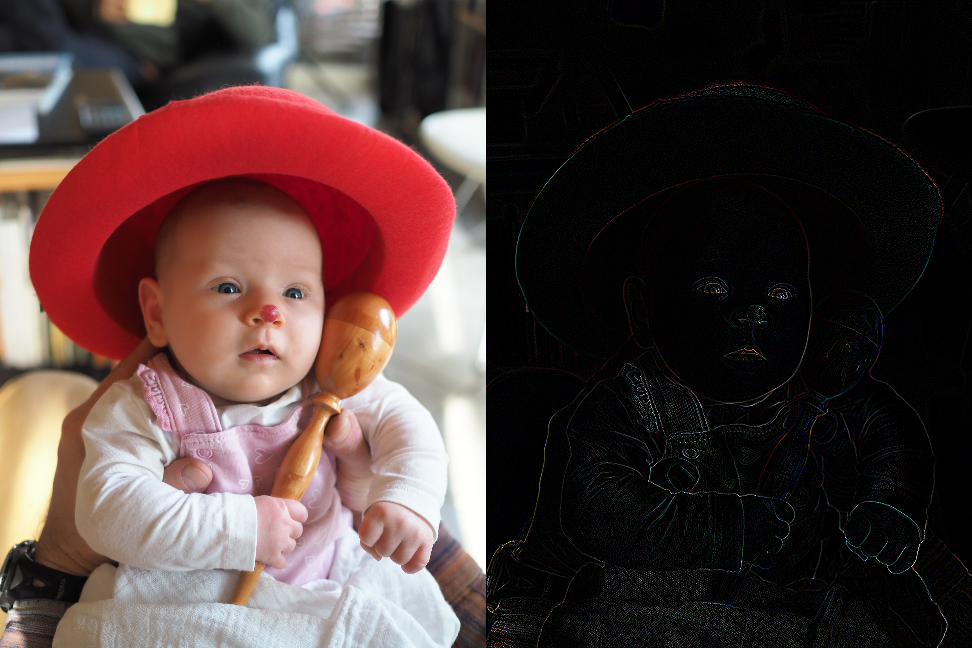

In [14]:
# Apply Laplace filter?
Edges = imfilter(img, Kernel.Laplacian())
[img Edges]

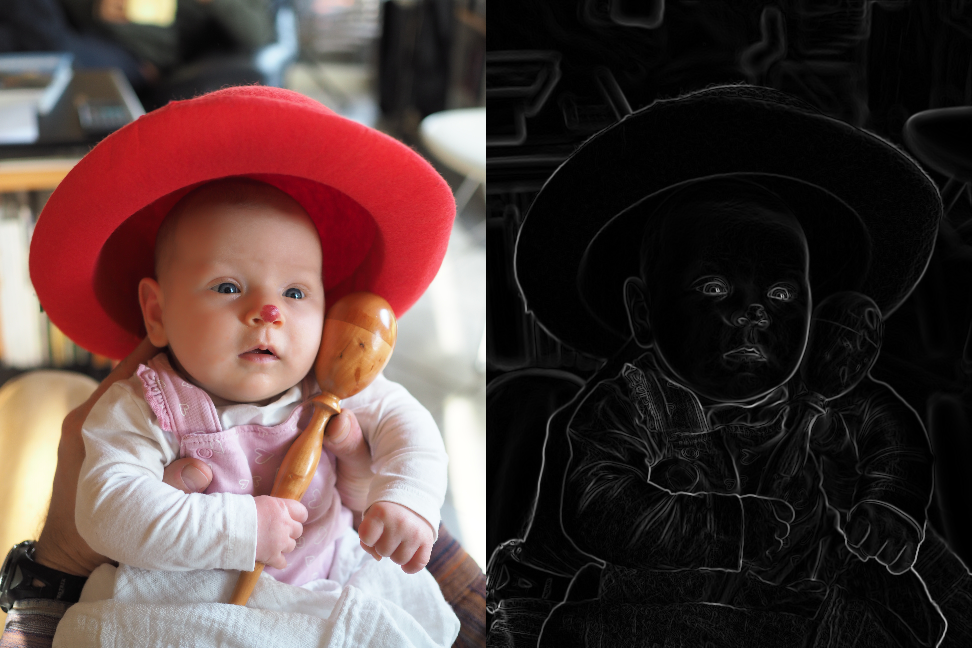

In [15]:
# Apply Sobel filter!
grayimg = Gray.(img)
sobel_x = centered([ 1 0 -1; 2 0 -2; 1 0 -1 ]);
sobel_y = sobel_x';
# Scale the kernel values to reduce the effect.
sobel_x = sobel_x / 4.0;
sobel_y = sobel_y / 4.0;
Gx = imfilter(grayimg,sobel_x);
Gy = imfilter(grayimg,sobel_y);
Edges .= sqrt.( Gx.^2 .+ Gy.^2 )
[img Edges]

In [5]:
# Find all edge coordinates whose gray values are larger than some threshold, here 0.02.
EdgeCoordinates = findall( x -> x>0.02, Real.(Gray.(Edges)) );
# Take a subset of this---5% turned out to be fine-grained enough to reproduce the fine details like the eyes, while still showing sufficiently large triangles.
VerticesCartesianIndex = randsubseq(EdgeCoordinates,0.05);
# Some cosmetics? Blend out towards the verge of the image, take out some of the coordinates at the verge of the image? Not today.
#VerticesCloseToBoundary = VerticesCartesianIndex[ findall( x -> x[1]<0.06*h || x[2]<0.06*w || x[1]>0.94*h || x[2]>0.94*w, VerticesCartesianIndex ) ]
#VerticesCartesianIndex = setdiff( VerticesCartesianIndex, randsubseq(VerticesCloseToBoundary,0.6) )
#VerticesCloseToBoundary = VerticesCartesianIndex[ findall( x -> x[1]<0.04*h || x[2]<0.04*w || x[1]>0.96*h || x[2]>0.96*w, VerticesCartesianIndex ) ]
#VerticesCartesianIndex = setdiff( VerticesCartesianIndex, randsubseq(VerticesCloseToBoundary,0.6) )
# Adding some random points? I decided against this. It does not improve the picture.
# RandomCoordinates = CartesianIndex.( rand( 1:h, 100 ), rand( 1:w, 100 ) )
# VerticesCartesianIndex = union( VerticesCartesianIndex, RandomCoordinates )
summary(VerticesCartesianIndex)

"7506-element Array{CartesianIndex{2},1}"

In [6]:
# Convert Vertices from CartesianIndex to Point2D for the tessellation algorithm.
l = Int64.(length(VerticesCartesianIndex))
Vertices = Array{Point2D,1}(undef,l)
stepsize = min( 1.0/h, 1.0/w )
for index in eachindex(VerticesCartesianIndex)
    (i,j) = Tuple(VerticesCartesianIndex[index])
    Vertices[index] = Point( 0.0+(j-0.5)*stepsize, 1.0-(i-0.5)*stepsize )
end
# Add some vertices outside the picture, so that the triangulation covers the whole image. 
# At the corners of the image...
#push!(Vertices, Point(0.0,1.0))
#push!(Vertices, Point(0.0+w*stepsize,1.0))
#push!(Vertices, Point(0.0+w*stepsize,1.0-h*stepsize))
#push!(Vertices, Point(0.0,1.0-h*stepsize))
# ... or somewhere further out, for a smoother look at the verge of the image? Further out!
push!(Vertices, Point(-0.1,1.1))
push!(Vertices, Point(0.1+w*stepsize,1.1))
push!(Vertices, Point(0.1+w*stepsize,0.9-h*stepsize))
push!(Vertices, Point(-0.1,0.9-h*stepsize))
push!(Vertices, Point(-0.3,1.0-h*stepsize/2.0))
push!(Vertices, Point(0.3+w*stepsize,1.0-h*stepsize/2.0))
push!(Vertices, Point(w*stepsize/2.0,1.3))
push!(Vertices, Point(w*stepsize/2.0,0.7-h*stepsize))
summary(Vertices)

"7514-element Array{Point2D,1}"

In [7]:
# Compute the Delaunay tessellation.
tess = DelaunayTessellation( Vertices )
# Get triangles, edges and points.
Triangles = delaunayTriangles(tess._trigs)
Edges = delaunayEdges(Triangles)
Points = VoronoiDelaunay.Vertices(tess)
# Plot the tessellation.
xyEdges = getplotxy(Edges,Points)
l1 = layer( x=getx.(Points), y=gety.(Points), color=[colorant"orange"], Geom.point )
l2 = layer( x=xyEdges[1], y=xyEdges[2], Geom.path )
set_default_plot_size(20cm,20cm)
plot( l1, l2, Coord.cartesian(fixed=true, xmin=-0.3, xmax=0.3+w*stepsize, ymin=0.7-h*stepsize, ymax=1.3) )

In [8]:
# Function that returns the triangle a pixel lies in.
function locateTriangle(tris, p)
    for t in tris
        a = ((t._b._y-t._c._y)*(p._x-t._c._x)+(t._c._x-t._b._x)*(p._y-t._c._y))/((t._b._y-t._c._y)*(t._a._x-t._c._x)+(t._c._x-t._b._x)*(t._a._y-t._c._y))
        b = ((t._c._y-t._a._y)*(p._x-t._c._x)+(t._a._x-t._c._x)*(p._y-t._c._y))/((t._b._y-t._c._y)*(t._a._x-t._c._x)+(t._c._x-t._b._x)*(t._a._y-t._c._y))
        c = 1-a-b
        if 0<=a<=1 && 0<=b<=1 && 0<=c<=1
            return t
            break
        end
    end
end

locateTriangle (generic function with 1 method)

In [9]:
# For each pixel, find the triangle the pixel lies in and gather all pixels corresponding to a triangle in a dictionary.
# The dictionary contains a list of cartesian indices (value) for every triangle (key).
PixelsInTriangle = Dict()
for i in 1:h
    for j in 1:w
        p = Point( 0.0+(j-0.5)*stepsize, 1.0-(i-0.5)*stepsize )
        t = locateTriangle( Triangles, Point( 0.0+(j-0.5)*stepsize, 1.0-(i-0.5)*stepsize ) )
        if haskey(PixelsInTriangle, t)
            push!( PixelsInTriangle[t], CartesianIndex(i,j) )
        else
            PixelsInTriangle[t] = [CartesianIndex(i,j)]
        end
    end
end

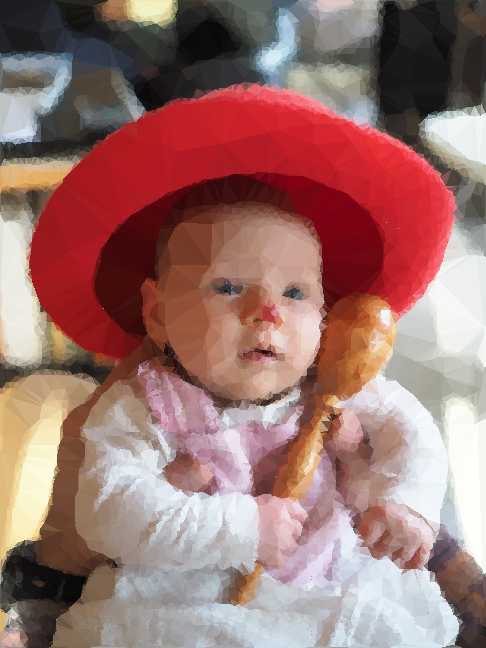

In [10]:
# Create the new image. Set pixel values as the mean of the input pixel values in the triangle.
new_img = similar(img)
for t in collect(keys(PixelsInTriangle))
    new_img[ PixelsInTriangle[t] ] .= mean( img[ PixelsInTriangle[t] ] )
end
new_img